<a href="https://colab.research.google.com/github/farrelrassya/teachingMLDL/blob/main/02.%20Deep%20Learning/01.%20Week%201/Notebooks/04.gradient_descent_3d_visualizationipynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Gradient Descent & Optimizers: A Visual Journey

## How Neural Networks "Learn" by Navigating Loss Landscapes

---

### Learning Objectives

After completing this notebook, students will be able to:

1. **Visualize** loss landscapes as "mountain ranges" that must be traversed
2. **Understand the intuition** behind gradient descent: following the steepest slope
3. **Differentiate** between various optimizers (GD, SGD, Momentum, Adam) and when to use them
4. **Explain** the local minima problem and how noise helps escape
5. **Analyze** the effect of learning rate on convergence

---

### Core Intuition: Imagine You're in the Mountains

```
Scenario: You're standing in a mountain range with your eyes closed.
Goal: Reach the lowest point (the deepest valley).
Strategy: Feel the slope of the ground with your feet, then step in the steepest downhill direction.

That's Gradient Descent!
```

| Analogy | Deep Learning Equivalent |
|---------|-------------------------|
| Your position in the mountains | Values of weights (w1, w2, ...) |
| Elevation where you stand | Loss/Error value |
| Slope of the ground | Gradient (dL/dw) |
| Your footstep | Weight update |
| Reaching the valley | Training complete (minimal loss) |

---
## Setup & Configuration

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib.colors import LightSource, LinearSegmentedColormap
import warnings
warnings.filterwarnings('ignore')

# Reproducibility
np.random.seed(42)

# ============================================================
# Custom Color Schemes for Stunning Visuals
# ============================================================

colors_terrain = ['#1a1a2e', '#16213e', '#0f3460', '#e94560', '#ff6b6b', '#ffd93d']
cmap_terrain = LinearSegmentedColormap.from_list('terrain_custom', colors_terrain, N=256)

colors_ocean = ['#0d1b2a', '#1b263b', '#415a77', '#778da9', '#e0e1dd', '#ffffff']
cmap_ocean = LinearSegmentedColormap.from_list('ocean_custom', colors_ocean, N=256)

colors_fire = ['#1a1a2e', '#4a1942', '#712B75', '#C74B50', '#D49B54', '#F6E3C5']
cmap_fire = LinearSegmentedColormap.from_list('fire_custom', colors_fire, N=256)

colors_sunset = ['#2d00f7', '#6a00f4', '#8900f2', '#a100f2', '#b100e8', '#bc00dd',
                  '#d100d1', '#db00b6', '#e500a4', '#f20089']
cmap_sunset = LinearSegmentedColormap.from_list('sunset', colors_sunset, N=256)

colors_emerald = ['#0d1117', '#1a472a', '#2d6a4f', '#40916c', '#52b788', '#95d5b2']
cmap_emerald = LinearSegmentedColormap.from_list('emerald', colors_emerald, N=256)

# Plot style configuration
plt.style.use('dark_background')
plt.rcParams.update({
    'figure.figsize': [14, 10],
    'font.size': 12,
    'font.family': 'sans-serif',
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'axes.facecolor': '#1a1a2e',
    'figure.facecolor': '#0d1117',
    'axes.edgecolor': '#ffffff',
    'axes.labelcolor': '#ffffff',
    'xtick.color': '#ffffff',
    'ytick.color': '#ffffff',
    'text.color': '#ffffff',
    'grid.color': '#333333',
    'grid.alpha': 0.3,
})

print("Setup complete!")
print("Custom color schemes loaded")
print("Dark theme activated for better visualization")

Setup complete!
Custom color schemes loaded
Dark theme activated for better visualization


---
# Part 1: Loss Landscape Functions

## What is a Loss Landscape?

A **Loss Landscape** visualizes how the loss value changes as parameters (weights) change.

- **X & Y axes**: Values of two weights (w1 and w2)
- **Z axis (height)**: Loss value

Our goal is to find the "deepest valley" - the point with the lowest loss!

In [ ]:
# ============================================================
# Loss Landscape Functions
# ============================================================

def simple_quadratic(x, y):
    """Simple Bowl - Single Global Minimum at (0,0)"""
    return x**2 + y**2

def elongated_quadratic(x, y):
    """Elongated Bowl - Ill-Conditioned Problem"""
    return x**2 + 50 * y**2

def rosenbrock(x, y, a=1, b=100):
    """Rosenbrock's Banana Function - Global minimum at (1,1)"""
    return (a - x)**2 + b * (y - x**2)**2

def multimodal(x, y):
    """Multiple Local Minima - Global minimum near (-1.5, -1)"""
    z = (np.sin(x) * np.cos(y) +
         0.5 * np.sin(2*x) * np.cos(2*y) +
         0.1 * (x**2 + y**2) +
         np.exp(-((x-1)**2 + (y-1)**2) / 2) * 0.5 -
         np.exp(-((x+1.5)**2 + (y+1)**2) / 1.5) * 1.5)
    return z

def rastrigin(x, y, A=10):
    """Rastrigin Function - Many local minima, global at (0,0)"""
    return A * 2 + (x**2 - A * np.cos(2 * np.pi * x)) + (y**2 - A * np.cos(2 * np.pi * y))

def saddle_point(x, y):
    """Saddle Point Function - z = x^2 - y^2"""
    return x**2 - y**2

def himmelblau(x, y):
    """Himmelblau's Function - Four global minima"""
    return (x**2 + y - 11)**2 + (x + y**2 - 7)**2

print("Loss Landscape Functions Defined:")
print("   simple_quadratic    -> Easy (bowl)")
print("   elongated_quadratic -> Ill-conditioned (trench)")
print("   rosenbrock          -> Banana valley")
print("   multimodal          -> Multiple local minima")
print("   rastrigin           -> Many local minima")
print("   saddle_point        -> Saddle point problem")
print("   himmelblau          -> Four global minima")

Loss Landscape Functions Defined:
   simple_quadratic    -> Easy (bowl)
   elongated_quadratic -> Ill-conditioned (trench)
   rosenbrock          -> Banana valley
   multimodal          -> Multiple local minima
   rastrigin           -> Many local minima
   saddle_point        -> Saddle point problem
   himmelblau          -> Four global minima


---
# Part 2: 3D Exploration of Each Loss Landscape

Let's visualize each loss landscape from multiple angles to understand their structure.

In [ ]:
# ============================================================
# 3D Exploration Function
# ============================================================

def explore_landscape_3d(func, title, xlim=(-3, 3), ylim=(-3, 3), cmap=cmap_terrain,
                          minima_points=None, description=""):
    """
    Create a comprehensive 3D exploration of a single loss landscape.
    Shows the landscape from 4 different angles plus a contour view.
    """
    x = np.linspace(xlim[0], xlim[1], 120)
    y = np.linspace(ylim[0], ylim[1], 120)
    X, Y = np.meshgrid(x, y)
    Z = func(X, Y)
    Z_clipped = np.clip(Z, np.percentile(Z, 1), np.percentile(Z, 97))

    fig = plt.figure(figsize=(20, 12))
    fig.patch.set_facecolor('#0d1117')

    angles = [
        (30, 45, 'Standard View (30, 45)'),
        (60, 120, 'High Angle (60, 120)'),
        (20, -45, 'Low Angle (20, -45)'),
        (45, 180, 'Back View (45, 180)')
    ]

    for idx, (elev, azim, view_name) in enumerate(angles):
        ax = fig.add_subplot(2, 3, idx + 1, projection='3d')
        ax.set_facecolor('#0d1117')

        ls = LightSource(azdeg=315, altdeg=45)
        rgb = ls.shade(Z_clipped, cmap=cmap, vert_exag=0.1, blend_mode='soft')

        surf = ax.plot_surface(X, Y, Z_clipped, rstride=1, cstride=1, facecolors=rgb,
                               linewidth=0, antialiased=True, alpha=0.95)

        if minima_points:
            for mx, my in minima_points:
                mz = func(mx, my)
                ax.scatter([mx], [my], [mz], c='#00ff00', s=150, marker='*',
                           edgecolors='white', linewidth=1.5, zorder=10)

        ax.set_xlabel('w1', fontsize=10, labelpad=5)
        ax.set_ylabel('w2', fontsize=10, labelpad=5)
        ax.set_zlabel('Loss', fontsize=10, labelpad=5)
        ax.set_title(view_name, fontsize=11, pad=10)
        ax.view_init(elev=elev, azim=azim)

        ax.xaxis.pane.fill = False
        ax.yaxis.pane.fill = False
        ax.zaxis.pane.fill = False

    # Contour plot
    ax_contour = fig.add_subplot(2, 3, 5)
    ax_contour.set_facecolor('#1a1a2e')

    contour = ax_contour.contourf(X, Y, Z_clipped, levels=60, cmap=cmap, alpha=0.95)
    ax_contour.contour(X, Y, Z_clipped, levels=30, colors='white', alpha=0.2, linewidths=0.5)

    if minima_points:
        for mx, my in minima_points:
            ax_contour.scatter([mx], [my], c='#00ff00', s=200, marker='*',
                              edgecolors='white', linewidth=1.5, zorder=10)

    ax_contour.set_xlabel('w1', fontsize=11)
    ax_contour.set_ylabel('w2', fontsize=11)
    ax_contour.set_title('Contour View (Top-Down)', fontsize=11)
    plt.colorbar(contour, ax=ax_contour, label='Loss', shrink=0.8)

    # Description panel
    ax_desc = fig.add_subplot(2, 3, 6)
    ax_desc.set_facecolor('#1a1a2e')
    ax_desc.axis('off')

    desc_text = f"""LANDSCAPE CHARACTERISTICS

{description}

STATISTICS:
  Min value: {np.min(Z):.4f}
  Max value: {np.max(Z):.4f}
  Range: {np.max(Z) - np.min(Z):.4f}
"""
    if minima_points:
        desc_text += "\nKNOWN MINIMA (green stars):"
        for i, (mx, my) in enumerate(minima_points):
            desc_text += f"\n  Point {i+1}: ({mx:.3f}, {my:.3f})"

    ax_desc.text(0.05, 0.95, desc_text, transform=ax_desc.transAxes,
                 fontsize=11, verticalalignment='top', fontfamily='monospace',
                 color='white', linespacing=1.5)

    plt.suptitle(title, fontsize=16, fontweight='bold', y=0.98, color='white')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

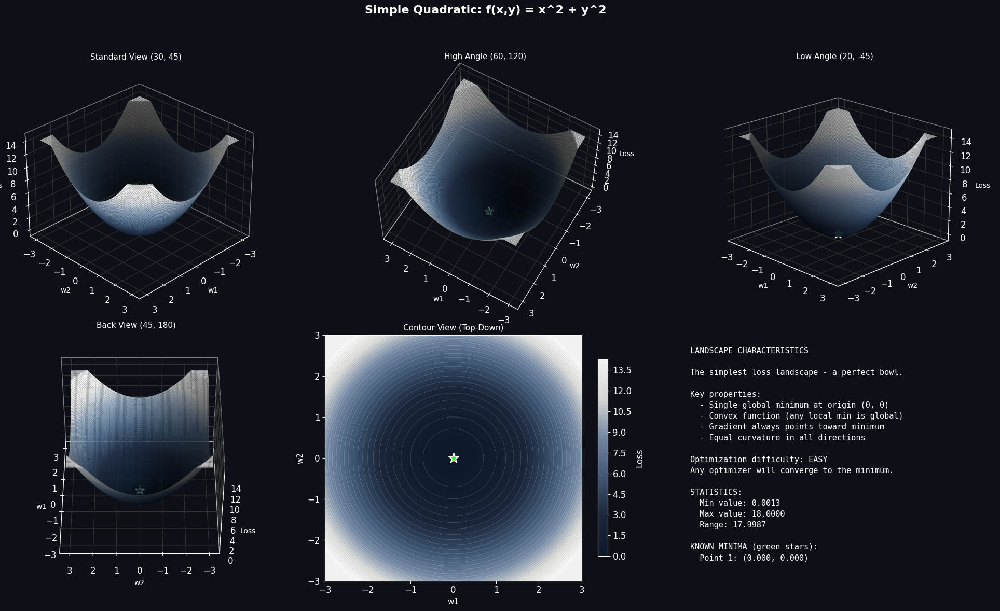

In [ ]:
# Exploration 1: Simple Quadratic
explore_landscape_3d(
    func=simple_quadratic,
    title="Simple Quadratic: f(x,y) = x^2 + y^2",
    xlim=(-3, 3), ylim=(-3, 3),
    cmap=cmap_ocean,
    minima_points=[(0, 0)],
    description="""The simplest loss landscape - a perfect bowl.

Key properties:
  - Single global minimum at origin (0, 0)
  - Convex function (any local min is global)
  - Gradient always points toward minimum
  - Equal curvature in all directions

Optimization difficulty: EASY
Any optimizer will converge to the minimum."""
)

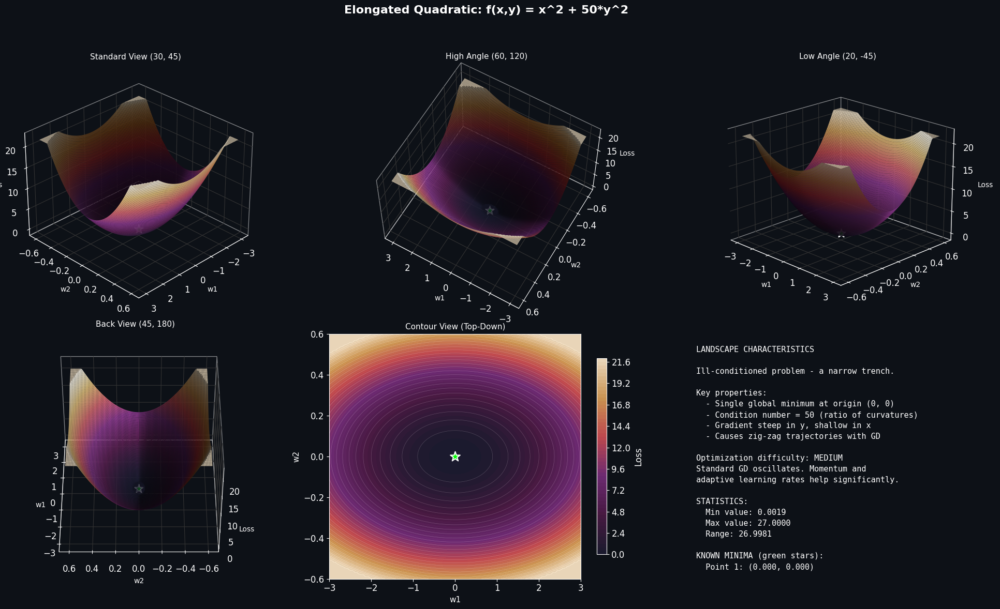

In [ ]:
# Exploration 2: Elongated Quadratic
explore_landscape_3d(
    func=elongated_quadratic,
    title="Elongated Quadratic: f(x,y) = x^2 + 50*y^2",
    xlim=(-3, 3), ylim=(-0.6, 0.6),
    cmap=cmap_fire,
    minima_points=[(0, 0)],
    description="""Ill-conditioned problem - a narrow trench.

Key properties:
  - Single global minimum at origin (0, 0)
  - Condition number = 50 (ratio of curvatures)
  - Gradient steep in y, shallow in x
  - Causes zig-zag trajectories with GD

Optimization difficulty: MEDIUM
Standard GD oscillates. Momentum and
adaptive learning rates help significantly."""
)

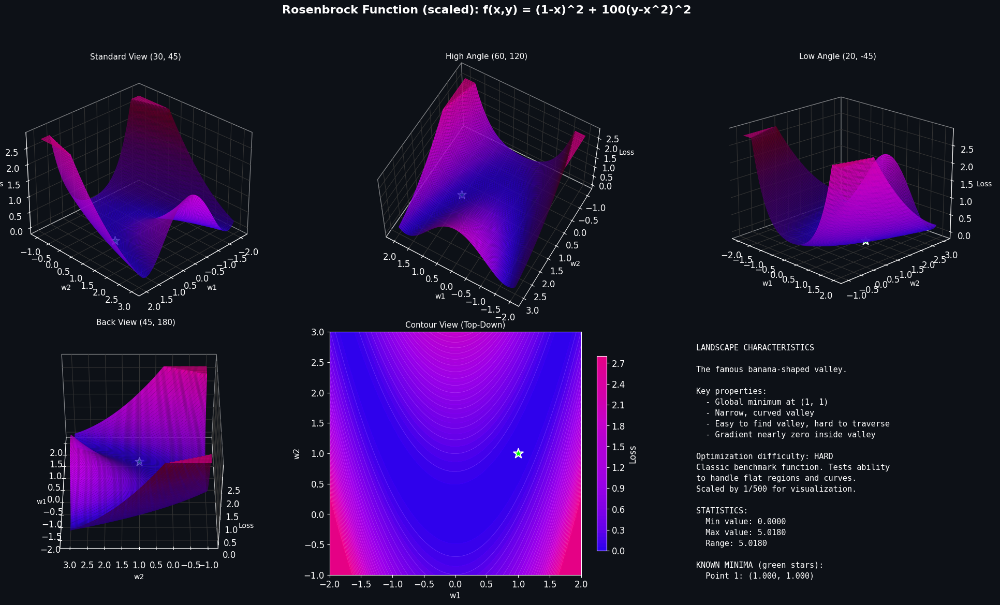

In [ ]:
# Exploration 3: Rosenbrock
rosenbrock_scaled = lambda x, y: rosenbrock(x, y) / 500

explore_landscape_3d(
    func=rosenbrock_scaled,
    title="Rosenbrock Function (scaled): f(x,y) = (1-x)^2 + 100(y-x^2)^2",
    xlim=(-2, 2), ylim=(-1, 3),
    cmap=cmap_sunset,
    minima_points=[(1, 1)],
    description="""The famous banana-shaped valley.

Key properties:
  - Global minimum at (1, 1)
  - Narrow, curved valley
  - Easy to find valley, hard to traverse
  - Gradient nearly zero inside valley

Optimization difficulty: HARD
Classic benchmark function. Tests ability
to handle flat regions and curves.
Scaled by 1/500 for visualization."""
)

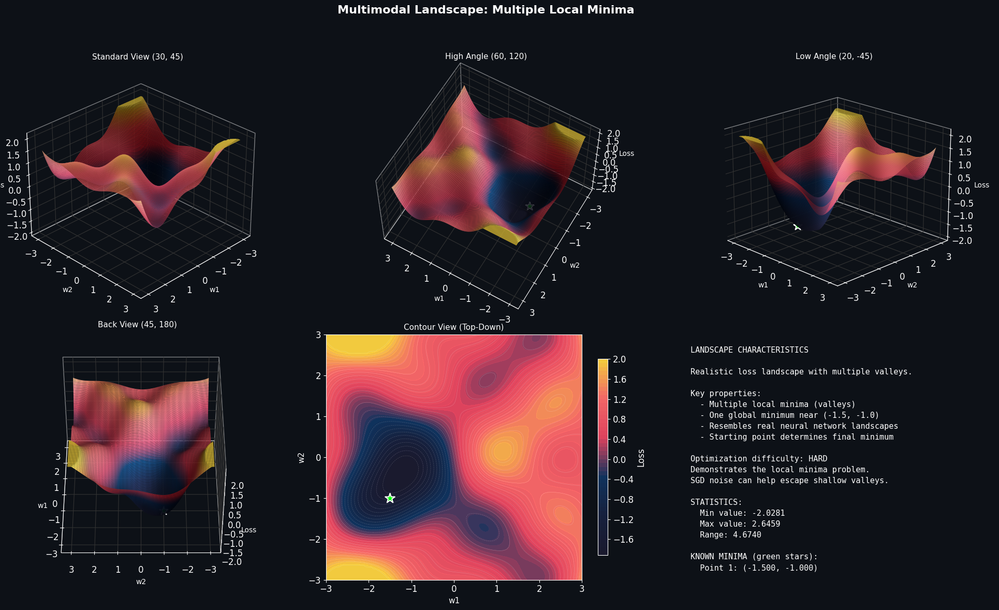

In [ ]:
# Exploration 4: Multimodal
explore_landscape_3d(
    func=multimodal,
    title="Multimodal Landscape: Multiple Local Minima",
    xlim=(-3, 3), ylim=(-3, 3),
    cmap=cmap_terrain,
    minima_points=[(-1.5, -1.0)],
    description="""Realistic loss landscape with multiple valleys.

Key properties:
  - Multiple local minima (valleys)
  - One global minimum near (-1.5, -1.0)
  - Resembles real neural network landscapes
  - Starting point determines final minimum

Optimization difficulty: HARD
Demonstrates the local minima problem.
SGD noise can help escape shallow valleys."""
)

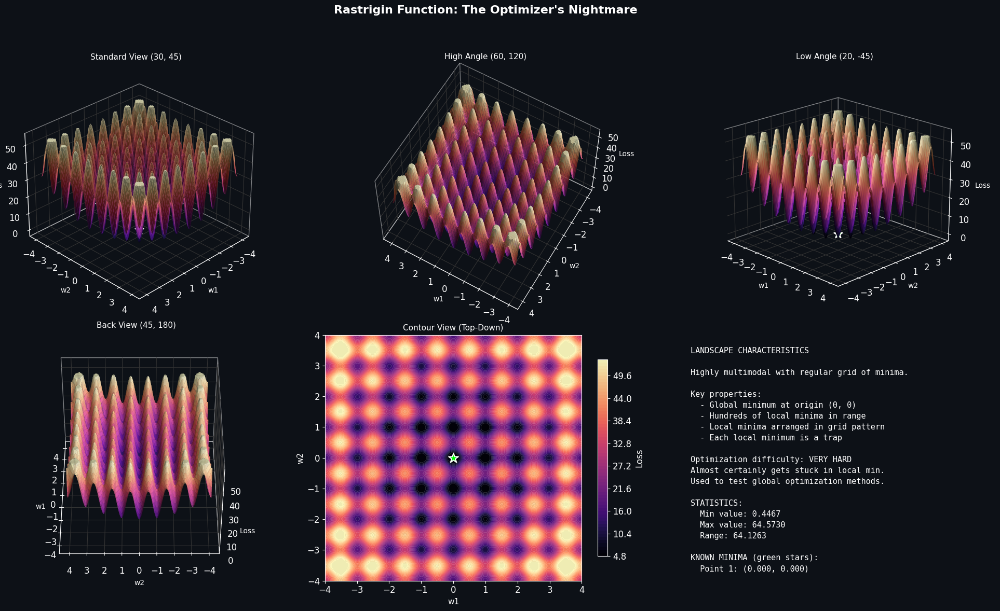

In [ ]:
# Exploration 5: Rastrigin
explore_landscape_3d(
    func=rastrigin,
    title="Rastrigin Function: The Optimizer's Nightmare",
    xlim=(-4, 4), ylim=(-4, 4),
    cmap=cm.magma,
    minima_points=[(0, 0)],
    description="""Highly multimodal with regular grid of minima.

Key properties:
  - Global minimum at origin (0, 0)
  - Hundreds of local minima in range
  - Local minima arranged in grid pattern
  - Each local minimum is a trap

Optimization difficulty: VERY HARD
Almost certainly gets stuck in local min.
Used to test global optimization methods."""
)

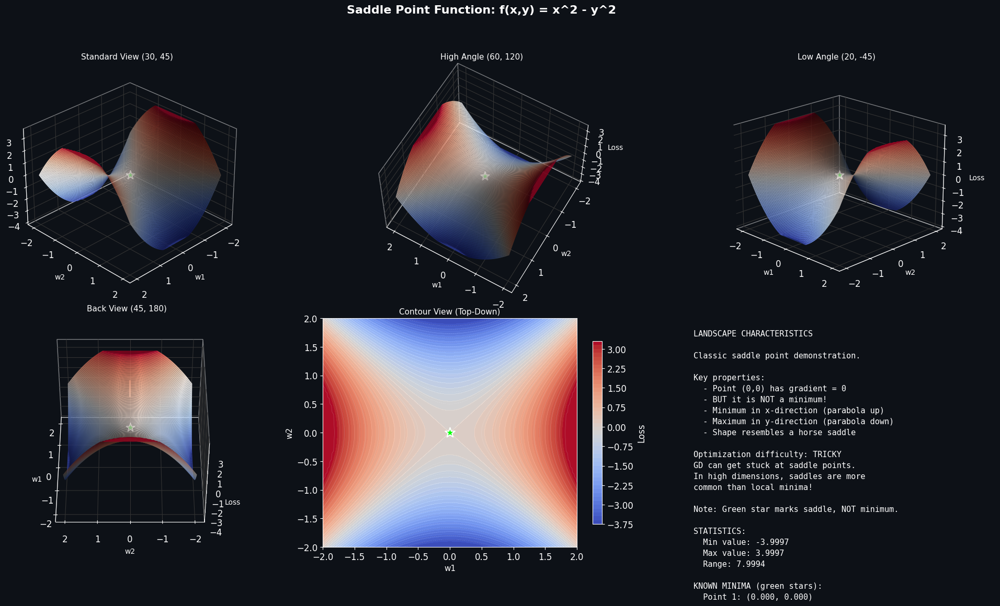

In [ ]:
# Exploration 6: Saddle Point
explore_landscape_3d(
    func=saddle_point,
    title="Saddle Point Function: f(x,y) = x^2 - y^2",
    xlim=(-2, 2), ylim=(-2, 2),
    cmap=cm.coolwarm,
    minima_points=[(0, 0)],
    description="""Classic saddle point demonstration.

Key properties:
  - Point (0,0) has gradient = 0
  - BUT it is NOT a minimum!
  - Minimum in x-direction (parabola up)
  - Maximum in y-direction (parabola down)
  - Shape resembles a horse saddle

Optimization difficulty: TRICKY
GD can get stuck at saddle points.
In high dimensions, saddles are more
common than local minima!

Note: Green star marks saddle, NOT minimum."""
)

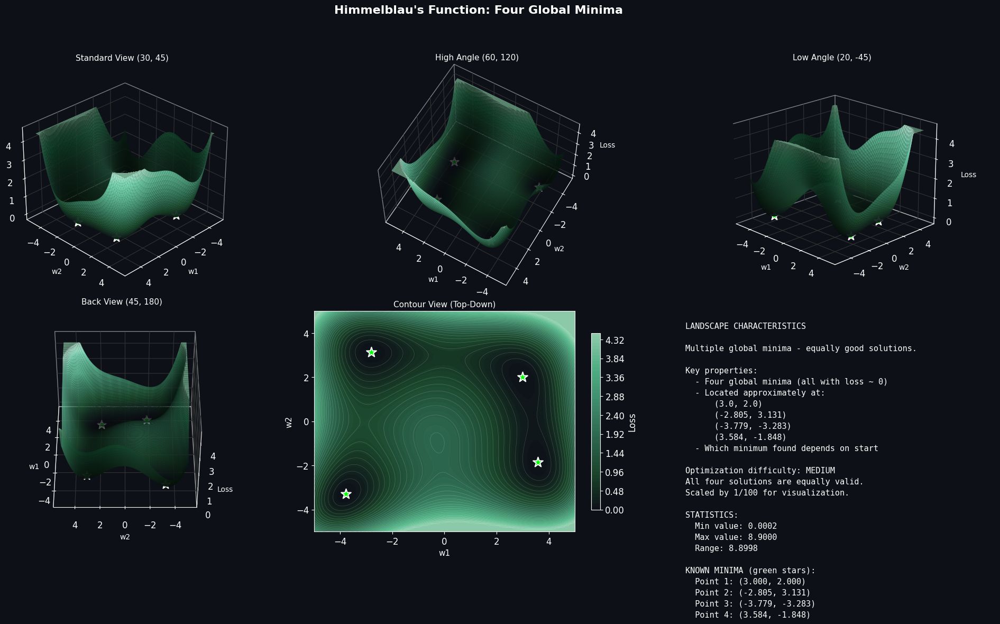

In [ ]:
# Exploration 7: Himmelblau
himmelblau_scaled = lambda x, y: himmelblau(x, y) / 100

explore_landscape_3d(
    func=himmelblau_scaled,
    title="Himmelblau's Function: Four Global Minima",
    xlim=(-5, 5), ylim=(-5, 5),
    cmap=cmap_emerald,
    minima_points=[(3.0, 2.0), (-2.805, 3.131), (-3.779, -3.283), (3.584, -1.848)],
    description="""Multiple global minima - equally good solutions.

Key properties:
  - Four global minima (all with loss ~ 0)
  - Located approximately at:
      (3.0, 2.0)
      (-2.805, 3.131)
      (-3.779, -3.283)
      (3.584, -1.848)
  - Which minimum found depends on start

Optimization difficulty: MEDIUM
All four solutions are equally valid.
Scaled by 1/100 for visualization."""
)

---
# Part 3: Optimizer Implementations

In [ ]:
# ============================================================
# Optimizer Implementations
# ============================================================

def numerical_gradient(f, x, y, eps=1e-7):
    """Compute gradient using central difference."""
    dx = (f(x + eps, y) - f(x - eps, y)) / (2 * eps)
    dy = (f(x, y + eps) - f(x, y - eps)) / (2 * eps)
    return dx, dy

def gradient_descent(f, start_x, start_y, lr=0.1, n_steps=100):
    """Vanilla Gradient Descent"""
    trajectory = []
    x, y = start_x, start_y
    for _ in range(n_steps):
        trajectory.append([x, y, f(x, y)])
        dx, dy = numerical_gradient(f, x, y)
        x = x - lr * dx
        y = y - lr * dy
    trajectory.append([x, y, f(x, y)])
    return np.array(trajectory)

def sgd(f, start_x, start_y, lr=0.1, n_steps=100, noise_scale=0.5):
    """Stochastic Gradient Descent"""
    trajectory = []
    x, y = start_x, start_y
    for _ in range(n_steps):
        trajectory.append([x, y, f(x, y)])
        dx, dy = numerical_gradient(f, x, y)
        dx += np.random.normal(0, noise_scale * (abs(dx) + 0.01))
        dy += np.random.normal(0, noise_scale * (abs(dy) + 0.01))
        x = x - lr * dx
        y = y - lr * dy
    trajectory.append([x, y, f(x, y)])
    return np.array(trajectory)

def sgd_momentum(f, start_x, start_y, lr=0.1, momentum=0.9, n_steps=100, noise_scale=0.3):
    """SGD with Momentum"""
    trajectory = []
    x, y = start_x, start_y
    vx, vy = 0.0, 0.0
    for _ in range(n_steps):
        trajectory.append([x, y, f(x, y)])
        dx, dy = numerical_gradient(f, x, y)
        dx += np.random.normal(0, noise_scale * (abs(dx) + 0.01))
        dy += np.random.normal(0, noise_scale * (abs(dy) + 0.01))
        vx = momentum * vx - lr * dx
        vy = momentum * vy - lr * dy
        x = x + vx
        y = y + vy
    trajectory.append([x, y, f(x, y)])
    return np.array(trajectory)

def rmsprop(f, start_x, start_y, lr=0.1, decay=0.9, n_steps=100, noise_scale=0.3):
    """RMSprop"""
    trajectory = []
    x, y = start_x, start_y
    cache_x, cache_y = 0.0, 0.0
    eps = 1e-8
    for _ in range(n_steps):
        trajectory.append([x, y, f(x, y)])
        dx, dy = numerical_gradient(f, x, y)
        dx += np.random.normal(0, noise_scale * (abs(dx) + 0.01))
        dy += np.random.normal(0, noise_scale * (abs(dy) + 0.01))
        cache_x = decay * cache_x + (1 - decay) * dx**2
        cache_y = decay * cache_y + (1 - decay) * dy**2
        x = x - lr * dx / (np.sqrt(cache_x) + eps)
        y = y - lr * dy / (np.sqrt(cache_y) + eps)
    trajectory.append([x, y, f(x, y)])
    return np.array(trajectory)

def adam(f, start_x, start_y, lr=0.1, beta1=0.9, beta2=0.999, n_steps=100, noise_scale=0.3):
    """Adam Optimizer"""
    trajectory = []
    x, y = start_x, start_y
    m_x, m_y = 0.0, 0.0
    v_x, v_y = 0.0, 0.0
    eps = 1e-8
    for step in range(n_steps):
        trajectory.append([x, y, f(x, y)])
        dx, dy = numerical_gradient(f, x, y)
        dx += np.random.normal(0, noise_scale * (abs(dx) + 0.01))
        dy += np.random.normal(0, noise_scale * (abs(dy) + 0.01))
        m_x = beta1 * m_x + (1 - beta1) * dx
        m_y = beta1 * m_y + (1 - beta1) * dy
        v_x = beta2 * v_x + (1 - beta2) * dx**2
        v_y = beta2 * v_y + (1 - beta2) * dy**2
        t = step + 1
        m_x_hat = m_x / (1 - beta1**t)
        m_y_hat = m_y / (1 - beta1**t)
        v_x_hat = v_x / (1 - beta2**t)
        v_y_hat = v_y / (1 - beta2**t)
        x = x - lr * m_x_hat / (np.sqrt(v_x_hat) + eps)
        y = y - lr * m_y_hat / (np.sqrt(v_y_hat) + eps)
    trajectory.append([x, y, f(x, y)])
    return np.array(trajectory)

print("Optimizers implemented: gradient_descent, sgd, sgd_momentum, rmsprop, adam")

Optimizers implemented: gradient_descent, sgd, sgd_momentum, rmsprop, adam


---
# Part 4: Trajectory Visualization

In [ ]:
def plot_trajectory(func, trajectory, title, xlim=(-3, 3), ylim=(-3, 3), cmap=cmap_terrain):
    """Visualize optimization trajectory in 3D and 2D."""
    fig = plt.figure(figsize=(18, 7))
    fig.patch.set_facecolor('#0d1117')

    x = np.linspace(xlim[0], xlim[1], 120)
    y = np.linspace(ylim[0], ylim[1], 120)
    X, Y = np.meshgrid(x, y)
    Z = func(X, Y)
    Z = np.clip(Z, np.percentile(Z, 1), np.percentile(Z, 97))

    # 3D Plot
    ax1 = fig.add_subplot(121, projection='3d')
    ax1.set_facecolor('#0d1117')

    ls = LightSource(azdeg=315, altdeg=45)
    rgb = ls.shade(Z, cmap=cmap, vert_exag=0.1, blend_mode='soft')
    ax1.plot_surface(X, Y, Z, rstride=1, cstride=1, facecolors=rgb,
                     linewidth=0, antialiased=True, alpha=0.9)

    ax1.plot(trajectory[:, 0], trajectory[:, 1], trajectory[:, 2],
             color='#00ff88', linewidth=3, zorder=10)

    ax1.scatter([trajectory[0, 0]], [trajectory[0, 1]], [trajectory[0, 2]],
                c='#00ff00', s=300, marker='o', edgecolors='white', linewidth=2, zorder=12)
    ax1.scatter([trajectory[-1, 0]], [trajectory[-1, 1]], [trajectory[-1, 2]],
                c='#ffd700', s=400, marker='*', edgecolors='white', linewidth=2, zorder=12)

    ax1.set_xlabel('w1')
    ax1.set_ylabel('w2')
    ax1.set_zlabel('Loss')
    ax1.set_title(f'{title} - 3D View', fontweight='bold')
    ax1.view_init(elev=30, azim=45)

    # 2D Contour
    ax2 = fig.add_subplot(122)
    ax2.set_facecolor('#1a1a2e')

    ax2.contourf(X, Y, Z, levels=60, cmap=cmap, alpha=0.9)
    ax2.contour(X, Y, Z, levels=25, colors='white', alpha=0.2, linewidths=0.5)

    ax2.plot(trajectory[:, 0], trajectory[:, 1], color='#00ff88', linewidth=2.5)
    ax2.scatter([trajectory[0, 0]], [trajectory[0, 1]], c='#00ff00', s=250, marker='o',
                edgecolors='white', linewidth=2, zorder=10)
    ax2.scatter([trajectory[-1, 0]], [trajectory[-1, 1]], c='#ffd700', s=350, marker='*',
                edgecolors='white', linewidth=2, zorder=10)

    ax2.set_xlabel('w1')
    ax2.set_ylabel('w2')
    ax2.set_title(f'{title} - Contour View', fontweight='bold')

    plt.tight_layout()
    plt.show()

    print(f"\nStart: ({trajectory[0, 0]:.4f}, {trajectory[0, 1]:.4f}) -> Loss: {trajectory[0, 2]:.6f}")
    print(f"End:   ({trajectory[-1, 0]:.4f}, {trajectory[-1, 1]:.4f}) -> Loss: {trajectory[-1, 2]:.6f}")

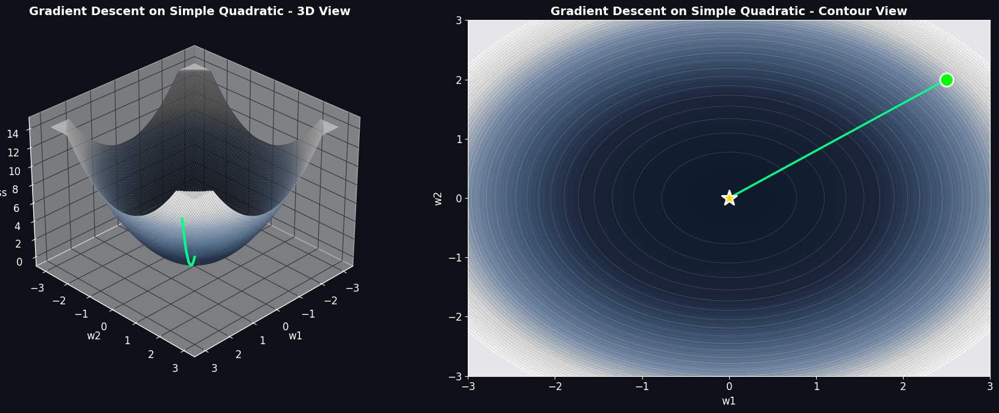


Start: (2.5000, 2.0000) -> Loss: 10.250000
End:   (0.0000, 0.0000) -> Loss: 0.000000


In [ ]:
# Demo 1: GD on Simple Quadratic
np.random.seed(42)
traj = gradient_descent(simple_quadratic, start_x=2.5, start_y=2.0, lr=0.15, n_steps=50)
plot_trajectory(simple_quadratic, traj, "Gradient Descent on Simple Quadratic", cmap=cmap_ocean)

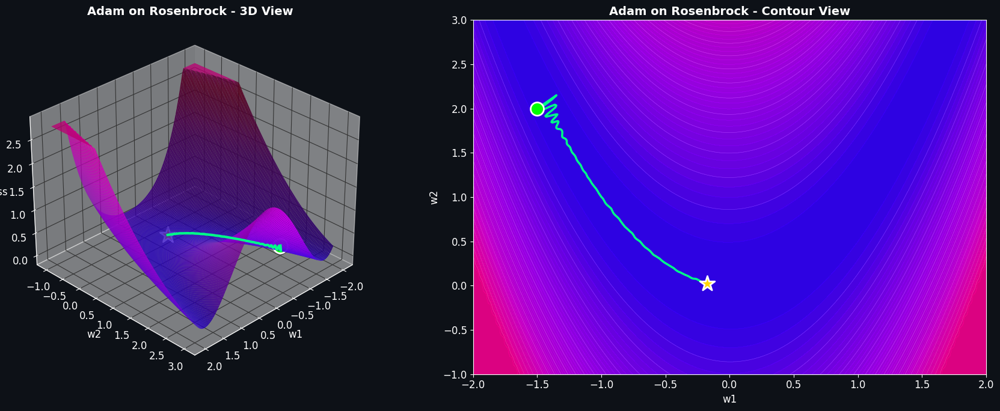


Start: (-1.5000, 2.0000) -> Loss: 0.025000
End:   (-0.1761, 0.0218) -> Loss: 0.002783


In [ ]:
# Demo 2: Adam on Rosenbrock
np.random.seed(42)
traj = adam(rosenbrock_scaled, start_x=-1.5, start_y=2.0, lr=0.15, n_steps=200, noise_scale=0.2)
plot_trajectory(rosenbrock_scaled, traj, "Adam on Rosenbrock", xlim=(-2, 2), ylim=(-1, 3), cmap=cmap_sunset)

---
# Part 5: Learning Rate Effects - FIXED Overshooting Visualization

In [ ]:
# ============================================================
# Learning Rate Demo - Fixed to show proper overshooting
# ============================================================

def learning_rate_demo_fixed(func, start_x, start_y, xlim=(-3, 3), ylim=(-3, 3),
                             n_steps=50, cmap=cmap_ocean):
    """
    Demonstrate learning rate effects with proper overshooting visualization.
    Uses fewer steps and extended axis range to show divergence clearly.
    """
    # Extended limits to show overshooting
    xlim_ext = (xlim[0] * 2, xlim[1] * 2)
    ylim_ext = (ylim[0] * 2, ylim[1] * 2)

    x = np.linspace(xlim_ext[0], xlim_ext[1], 100)
    y = np.linspace(ylim_ext[0], ylim_ext[1], 100)
    X, Y = np.meshgrid(x, y)
    Z = func(X, Y)
    Z_clipped = np.clip(Z, np.percentile(Z, 1), np.percentile(Z, 97))

    # Learning rates chosen to clearly show different behaviors
    learning_rates = [0.001, 0.05, 0.15, 0.6]
    titles = [
        'lr=0.001 (Too Small)\nBarely moves',
        'lr=0.05 (Small)\nSlow but stable',
        'lr=0.15 (Good)\nFast convergence',
        'lr=0.6 (Too Large)\nOvershooting!'
    ]
    colors = ['#4ecdc4', '#45b7d1', '#00ff88', '#ff6b6b']

    fig = plt.figure(figsize=(22, 12))
    fig.patch.set_facecolor('#0d1117')

    trajectories = []

    # Top row: Individual trajectory plots
    for idx, (lr, title, color) in enumerate(zip(learning_rates, titles, colors)):
        ax = fig.add_subplot(2, 4, idx + 1)
        ax.set_facecolor('#1a1a2e')

        ax.contourf(X, Y, Z_clipped, levels=50, cmap=cmap, alpha=0.9)
        ax.contour(X, Y, Z_clipped, levels=25, colors='white', alpha=0.2, linewidths=0.5)

        # Run GD without any safety clipping
        traj = gradient_descent(func, start_x, start_y, lr=lr, n_steps=n_steps)
        trajectories.append((traj, lr, color))

        # Check if diverged (went outside original bounds significantly)
        max_coord = max(np.max(np.abs(traj[:, 0])), np.max(np.abs(traj[:, 1])))
        diverged = max_coord > max(abs(xlim[0]), abs(xlim[1])) * 1.5

        # Plot trajectory
        ax.plot(traj[:, 0], traj[:, 1], color=color, linewidth=2.5, alpha=0.9)

        # Plot points to show oscillation
        step = max(1, len(traj) // 20)
        for i in range(0, len(traj), step):
            ax.scatter([traj[i, 0]], [traj[i, 1]], color=color, s=30,
                       edgecolors='white', linewidth=0.5, zorder=5)

        # Start marker
        ax.scatter([start_x], [start_y], c='#00ff00', s=200, marker='o',
                   edgecolors='white', linewidth=2, zorder=10)

        # End marker
        ax.scatter([traj[-1, 0]], [traj[-1, 1]], c='#ffd700', s=200, marker='*',
                   edgecolors='white', linewidth=2, zorder=10)

        if diverged:
            ax.text(0.5, 0.95, 'DIVERGING!', transform=ax.transAxes, fontsize=14,
                   color='red', fontweight='bold', ha='center', va='top',
                   bbox=dict(boxstyle='round', facecolor='black', alpha=0.8))

        ax.set_xlabel('w1')
        ax.set_ylabel('w2')
        ax.set_title(title, fontweight='bold')
        ax.set_xlim(xlim_ext)
        ax.set_ylim(ylim_ext)

        # Draw original bounds
        ax.axvline(x=xlim[0], color='gray', linestyle='--', alpha=0.5)
        ax.axvline(x=xlim[1], color='gray', linestyle='--', alpha=0.5)
        ax.axhline(y=ylim[0], color='gray', linestyle='--', alpha=0.5)
        ax.axhline(y=ylim[1], color='gray', linestyle='--', alpha=0.5)

    # Bottom left: All trajectories combined
    ax_combined = fig.add_subplot(2, 4, 5)
    ax_combined.set_facecolor('#1a1a2e')
    ax_combined.contourf(X, Y, Z_clipped, levels=50, cmap=cmap, alpha=0.9)

    for traj, lr, color in trajectories:
        ax_combined.plot(traj[:, 0], traj[:, 1], color=color, linewidth=2,
                        label=f'lr={lr}', alpha=0.9)

    ax_combined.scatter([start_x], [start_y], c='white', s=200, marker='o',
                       edgecolors='black', linewidth=2, zorder=10)
    ax_combined.set_xlabel('w1')
    ax_combined.set_ylabel('w2')
    ax_combined.set_title('All Learning Rates Compared', fontweight='bold')
    ax_combined.set_xlim(xlim_ext)
    ax_combined.set_ylim(ylim_ext)
    ax_combined.legend(fontsize=10)

    # Bottom middle: Loss curves (linear)
    ax_loss1 = fig.add_subplot(2, 4, 6)
    ax_loss1.set_facecolor('#1a1a2e')

    for traj, lr, color in trajectories:
        losses = traj[:, 2]
        ax_loss1.plot(losses, color=color, linewidth=2.5, label=f'lr={lr}')

    ax_loss1.set_xlabel('Step')
    ax_loss1.set_ylabel('Loss')
    ax_loss1.set_title('Loss Curves (Linear Scale)', fontweight='bold')
    ax_loss1.legend(fontsize=10)
    ax_loss1.grid(True, alpha=0.3)
    ax_loss1.set_ylim(0, max(50, np.max([t[0][-1, 2] for t in trajectories if t[0][-1, 2] < 1000]))) # FIX IS HERE

    # Bottom right-middle: Loss curves (log)
    ax_loss2 = fig.add_subplot(2, 4, 7)
    ax_loss2.set_facecolor('#1a1a2e')

    for traj, lr, color in trajectories:
        losses = np.clip(traj[:, 2], 1e-10, 1e6)
        ax_loss2.plot(losses, color=color, linewidth=2.5, label=f'lr={lr}')

    ax_loss2.set_xlabel('Step')
    ax_loss2.set_ylabel('Loss (log)')
    ax_loss2.set_title('Loss Curves (Log Scale)', fontweight='bold')
    ax_loss2.legend(fontsize=10)
    ax_loss2.grid(True, alpha=0.3)
    ax_loss2.set_yscale('log')

    # Bottom right: Guidelines
    ax_text = fig.add_subplot(2, 4, 8)
    ax_text.set_facecolor('#1a1a2e')
    ax_text.axis('off')

    guidelines = """LEARNING RATE GUIDELINES

Too Small (lr << 0.01):
  - Very slow convergence
  - May get stuck
  - Safe but inefficient

Too Large (lr > 0.3):
  - Overshoots minimum
  - Oscillates wildly
  - Can diverge (loss explodes)

Just Right:
  - Fast convergence
  - Stable trajectory
  - Reaches low loss

PRACTICAL TIPS:
  - Adam default: lr = 0.001
  - SGD default: lr = 0.01
  - Use LR schedulers
  - Try LR finder methods
"""
    ax_text.text(0.05, 0.95, guidelines, transform=ax_text.transAxes,
                fontsize=11, verticalalignment='top', fontfamily='monospace',
                color='white', linespacing=1.4)

    plt.suptitle('Learning Rate Effect on Gradient Descent', fontsize=16, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

    # Print results
    print("\nFinal Losses:")
    for traj, lr, _ in trajectories:
        status = "DIVERGED" if traj[-1, 2] > 100 else "OK"
        print(f"   lr = {lr:6.3f} -> Loss: {traj[-1, 2]:12.4f} [{status}]")

LEARNING RATE DEMO: Simple Quadratic


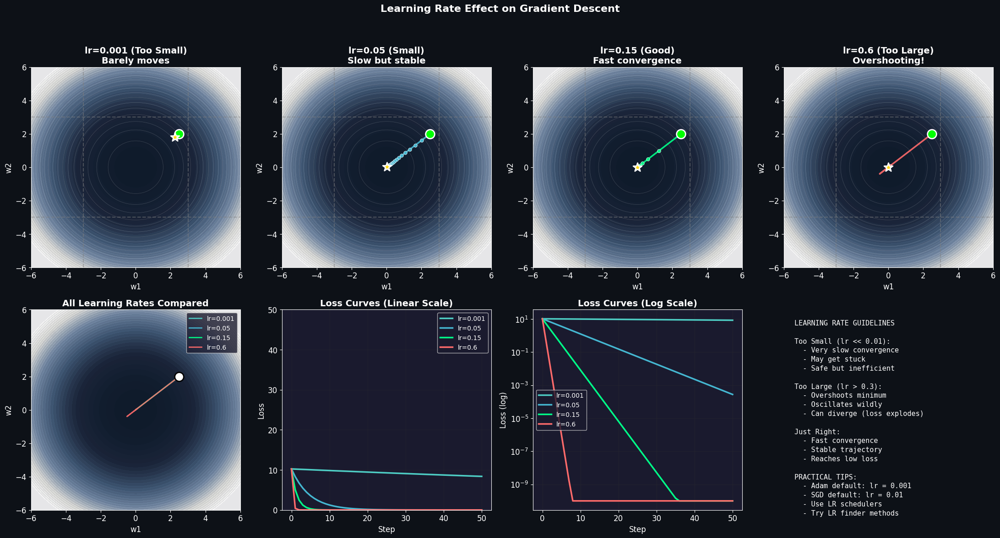


Final Losses:
   lr =  0.001 -> Loss:       8.3903 [OK]
   lr =  0.050 -> Loss:       0.0003 [OK]
   lr =  0.150 -> Loss:       0.0000 [OK]
   lr =  0.600 -> Loss:       0.0000 [OK]


In [ ]:
# Demo: Learning rate effects on simple quadratic
print("="*60)
print("LEARNING RATE DEMO: Simple Quadratic")
print("="*60)

learning_rate_demo_fixed(simple_quadratic, start_x=2.5, start_y=2.0, n_steps=50)

LEARNING RATE DEMO: Elongated Quadratic


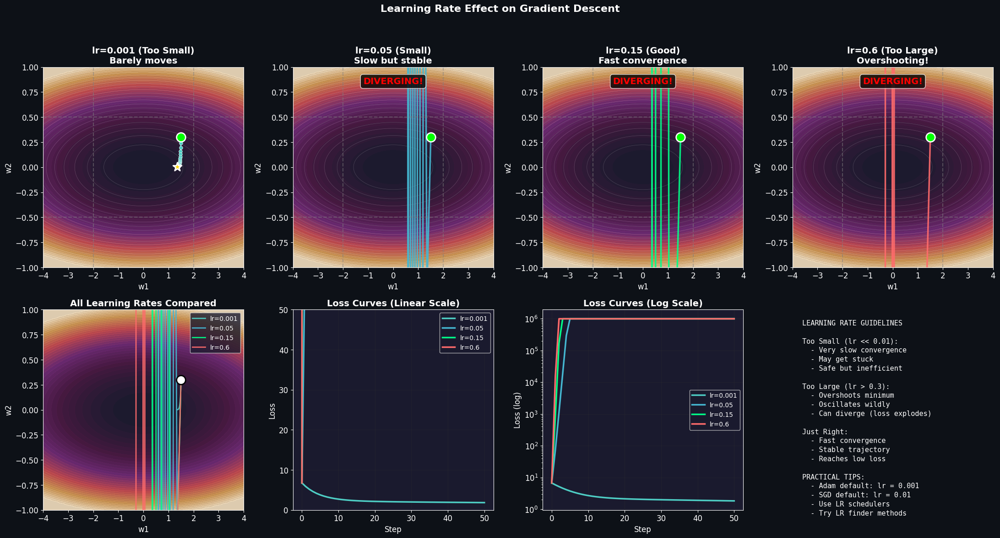


Final Losses:
   lr =  0.001 -> Loss:       1.8419 [OK]
   lr =  0.050 -> Loss: 105991625880483627008.0000 [DIVERGED]
   lr =  0.150 -> Loss: 3843609527236162486272.0000 [DIVERGED]
   lr =  0.600 -> Loss: 7288331612823491706880.0000 [DIVERGED]


In [ ]:
# Demo: Learning rate on elongated quadratic (shows oscillation better)
print("="*60)
print("LEARNING RATE DEMO: Elongated Quadratic")
print("="*60)

learning_rate_demo_fixed(elongated_quadratic, start_x=1.5, start_y=0.3,
                         xlim=(-2, 2), ylim=(-0.5, 0.5), n_steps=50, cmap=cmap_fire)

---
# Part 6: Optimizer Race

In [ ]:
def optimizer_race(func, start_x, start_y, xlim=(-3, 3), ylim=(-3, 3),
                   n_steps=200, title="Optimizer Race", cmap=cmap_terrain):
    """Compare all optimizers head-to-head."""
    x = np.linspace(xlim[0], xlim[1], 100)
    y = np.linspace(ylim[0], ylim[1], 100)
    X, Y = np.meshgrid(x, y)
    Z = func(X, Y)
    Z = np.clip(Z, np.percentile(Z, 1), np.percentile(Z, 97))

    configs = [
        ('GD', lambda: gradient_descent(func, start_x, start_y, lr=0.05, n_steps=n_steps), '#ff6b6b'),
        ('SGD', lambda: sgd(func, start_x, start_y, lr=0.05, n_steps=n_steps, noise_scale=0.4), '#4ecdc4'),
        ('Momentum', lambda: sgd_momentum(func, start_x, start_y, lr=0.02, n_steps=n_steps), '#45b7d1'),
        ('RMSprop', lambda: rmsprop(func, start_x, start_y, lr=0.1, n_steps=n_steps), '#96ceb4'),
        ('Adam', lambda: adam(func, start_x, start_y, lr=0.15, n_steps=n_steps), '#ffd93d'),
    ]

    trajectories = []
    for name, opt_func, color in configs:
        np.random.seed(42)
        traj = opt_func()
        trajectories.append((name, traj, color))

    fig = plt.figure(figsize=(20, 10))
    fig.patch.set_facecolor('#0d1117')

    # 3D Plot
    ax1 = fig.add_subplot(221, projection='3d')
    ax1.set_facecolor('#0d1117')
    ls = LightSource(azdeg=315, altdeg=45)
    rgb = ls.shade(Z, cmap=cmap, vert_exag=0.1, blend_mode='soft')
    ax1.plot_surface(X, Y, Z, rstride=2, cstride=2, facecolors=rgb, alpha=0.7)

    for name, traj, color in trajectories:
        ax1.plot(traj[:, 0], traj[:, 1], traj[:, 2], color=color, linewidth=2.5, label=name)

    ax1.scatter([start_x], [start_y], [func(start_x, start_y)], c='white', s=200, zorder=10)
    ax1.set_title('3D Trajectories', fontweight='bold')
    ax1.legend()

    # Contour
    ax2 = fig.add_subplot(222)
    ax2.set_facecolor('#1a1a2e')
    ax2.contourf(X, Y, Z, levels=50, cmap=cmap, alpha=0.9)

    for name, traj, color in trajectories:
        ax2.plot(traj[:, 0], traj[:, 1], color=color, linewidth=2, label=name)
        ax2.scatter([traj[-1, 0]], [traj[-1, 1]], c=color, s=100, marker='*', zorder=10)

    ax2.scatter([start_x], [start_y], c='white', s=200, zorder=10)
    ax2.set_title('Contour View', fontweight='bold')
    ax2.legend()

    # Loss curves
    ax3 = fig.add_subplot(223)
    ax3.set_facecolor('#1a1a2e')
    for name, traj, color in trajectories:
        ax3.plot(traj[:, 2], color=color, linewidth=2.5, label=name)
    ax3.set_xlabel('Step')
    ax3.set_ylabel('Loss')
    ax3.set_title('Loss Curves', fontweight='bold')
    ax3.legend()
    ax3.set_yscale('log')
    ax3.grid(True, alpha=0.3)

    # Bar chart
    ax4 = fig.add_subplot(224)
    ax4.set_facecolor('#1a1a2e')
    names = [t[0] for t in trajectories]
    losses = [t[1][-1, 2] for t in trajectories]
    colors = [t[2] for t in trajectories]
    bars = ax4.barh(names, losses, color=colors)
    ax4.set_xlabel('Final Loss')
    ax4.set_title('Final Results', fontweight='bold')

    plt.suptitle(title, fontsize=16, fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

    print("\nResults:")
    for name, traj, _ in sorted(trajectories, key=lambda x: x[1][-1, 2]):
        print(f"   {name:12} -> Loss: {traj[-1, 2]:.6f}")

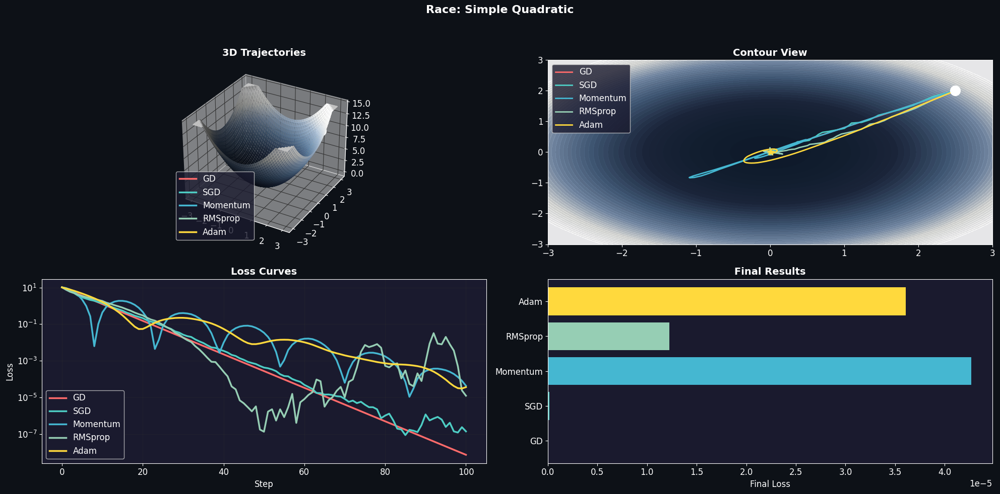


Results:
   GD           -> Loss: 0.000000
   SGD          -> Loss: 0.000000
   RMSprop      -> Loss: 0.000012
   Adam         -> Loss: 0.000036
   Momentum     -> Loss: 0.000043


In [ ]:
optimizer_race(simple_quadratic, 2.5, 2.0, n_steps=100, title="Race: Simple Quadratic", cmap=cmap_ocean)

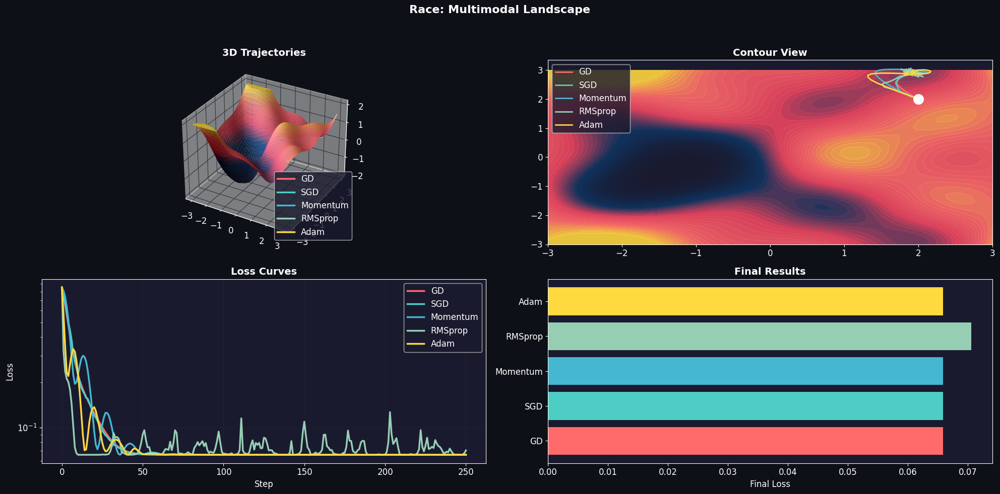


Results:
   GD           -> Loss: 0.065908
   SGD          -> Loss: 0.065908
   Momentum     -> Loss: 0.065908
   Adam         -> Loss: 0.065908
   RMSprop      -> Loss: 0.070552


In [ ]:
optimizer_race(multimodal, 2.0, 2.0, n_steps=250, title="Race: Multimodal Landscape", cmap=cmap_terrain)

---
# Part 7: Local Minima and SGD Escape

In [ ]:
def local_minima_demo(func, n_starts=30, xlim=(-3, 3), ylim=(-3, 3), cmap=cmap_terrain):
    """Show how different starting points lead to different minima."""
    x = np.linspace(xlim[0], xlim[1], 100)
    y = np.linspace(ylim[0], ylim[1], 100)
    X, Y = np.meshgrid(x, y)
    Z = func(X, Y)
    Z = np.clip(Z, np.percentile(Z, 2), np.percentile(Z, 97))

    np.random.seed(42)
    final_losses = []
    colors = plt.cm.rainbow(np.linspace(0, 1, n_starts))

    fig = plt.figure(figsize=(18, 6))
    fig.patch.set_facecolor('#0d1117')

    # Contour with trajectories
    ax1 = fig.add_subplot(121)
    ax1.set_facecolor('#1a1a2e')
    ax1.contourf(X, Y, Z, levels=50, cmap=cmap, alpha=0.9)

    for i in range(n_starts):
        sx = np.random.uniform(xlim[0]*0.8, xlim[1]*0.8)
        sy = np.random.uniform(ylim[0]*0.8, ylim[1]*0.8)
        traj = gradient_descent(func, sx, sy, lr=0.05, n_steps=200)
        final_losses.append(traj[-1, 2])
        ax1.plot(traj[:, 0], traj[:, 1], color=colors[i], linewidth=1, alpha=0.6)
        ax1.scatter([traj[-1, 0]], [traj[-1, 1]], color=colors[i], s=60, marker='*', zorder=5)

    ax1.set_title(f'{n_starts} Random Starting Points', fontweight='bold')
    ax1.set_xlabel('w1')
    ax1.set_ylabel('w2')

    # Histogram
    ax2 = fig.add_subplot(122)
    ax2.set_facecolor('#1a1a2e')
    ax2.hist(final_losses, bins=15, color='#4ecdc4', edgecolor='white')
    ax2.axvline(min(final_losses), color='green', linestyle='--', linewidth=2, label=f'Best: {min(final_losses):.4f}')
    ax2.axvline(np.mean(final_losses), color='yellow', linestyle='--', linewidth=2, label=f'Mean: {np.mean(final_losses):.4f}')
    ax2.set_title('Distribution of Final Losses', fontweight='bold')
    ax2.set_xlabel('Final Loss')
    ax2.set_ylabel('Count')
    ax2.legend()
    ax2.grid(True, alpha=0.3)

    plt.suptitle('Local Minima Problem: Where You Start Matters!', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

    print(f"\nBest: {min(final_losses):.6f}, Worst: {max(final_losses):.6f}, Std: {np.std(final_losses):.6f}")

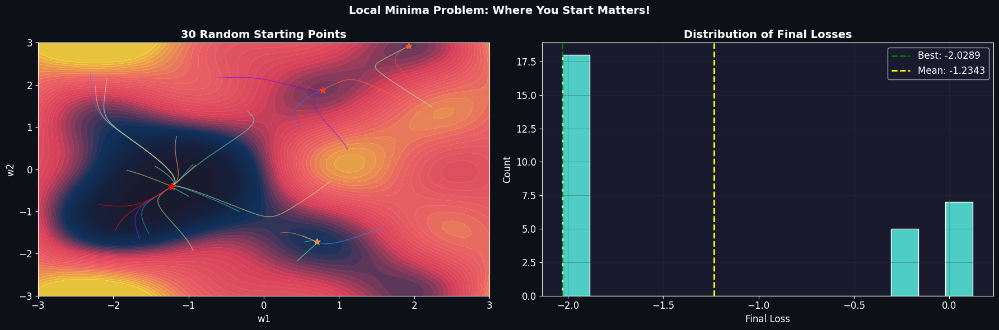


Best: -2.028873, Worst: 0.124061, Std: 0.979687


In [ ]:
local_minima_demo(multimodal)

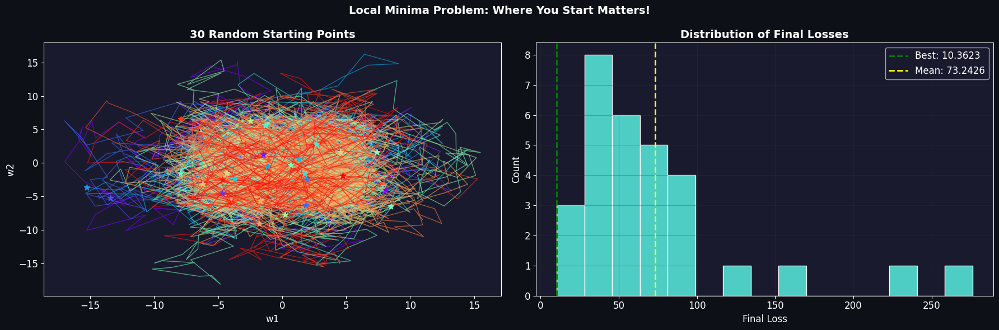


Best: 10.362254, Worst: 276.214366, Std: 58.286368


In [ ]:
local_minima_demo(rastrigin, xlim=(-4, 4), ylim=(-4, 4), cmap=cm.magma)

---
# Summary

| Concept | Description |
|---------|-------------|
| **Loss Landscape** | 3D surface where height = loss |
| **Gradient** | Direction of steepest ascent |
| **Gradient Descent** | Move opposite to gradient |
| **Learning Rate** | Step size per iteration |
| **Local Minimum** | Valley that isn't the deepest |
| **Global Minimum** | Absolute lowest point |
| **Saddle Point** | Gradient = 0, but not minimum |

## Optimizer Comparison

| Optimizer | Pros | Cons |
|-----------|------|------|
| **GD** | Simple | Stuck in local minima |
| **SGD** | Escapes local minima | Noisy |
| **Momentum** | Faster, smoother | Extra hyperparameter |
| **Adam** | Works out-of-the-box | More memory |

## Practical Tips

1. Start with Adam (lr=0.001)
2. Use learning rate schedulers
3. Try multiple random seeds
4. SGD+Momentum often best for final performance

In [ ]:
# Your experiment space
print("Try experimenting with:")
print("  1. Different loss functions")
print("  2. Different starting points")
print("  3. Different learning rates")
print("  4. Different optimizers")

Try experimenting with:
  1. Different loss functions
  2. Different starting points
  3. Different learning rates
  4. Different optimizers
